Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Открою файл с данными и изучу общую информацию

In [1]:
# импорт библиотек

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy.stats as stats
import warnings
import re
import plotly.express as px
import plotly.graph_objects as go
from folium import Map, Marker, Figure, Choropleth
from folium.plugins import MarkerCluster

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

In [3]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', encoding='utf-8') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [4]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [5]:
display(df)
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
# для удобства заменим обозначения сетевых заведений
df['chain'] = df['chain'].map({0:'несетевое',1:'сетевое'})

Вывод

всего в данных хранится информация о 8406 заведениях;
типы данных у всех столбцов верные.

Шаг 2. Выполните предобработку данных
Изучу, есть ли дубликаты и пропуски в данных

In [7]:
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    df[col] = df[col].str.lower()

In [8]:
print(f'Дубликатов: {df.duplicated().sum()}')

Дубликатов: 0


In [9]:
df[df.duplicated(subset = ["name","address"])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,несетевое,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,сетевое,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,сетевое,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,несетевое,276.0



print ('Дубликтов по названию и адресу:',df.duplicated(subset=['name', 'address']).sum())

In [10]:
df.loc[df.duplicated(subset=['name', 'address'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,несетевое,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,несетевое,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,несетевое,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,сетевое,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,несетевое,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,сетевое,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,сетевое,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,несетевое,276.0


Действительно это одни и те же заведения питания. Удалим дубликаты оставив те, где информации больше либо зачения больше солответсвуют действительности.

Кафе на Ангаровских прудах которые показались как дубликаты - разные. 
При проверке по координатам выяснилось, что название кафе с индексом 189 назвается "get&fly" второе же предприятие питания, действительно назвается "кафе"

Ресторан more poke работает с 9 до 21 ежедневно Источник: https://o-eda-dostavka.ru/goroda/moscow/rest/more_poke_wfuoa/

Бар Раковарня работает Понедельник – Четверг, Воскресенье – с 12:00 до 00:00 Пятница – Суббота – с 12:00 до 01:00 Источник: https://alekseevskaya.kleshnihvosti.ru/contacts/

Пекарня Хлеб да выпечка работает с 9 до 22. Источник: https://yandex.ru/maps/org/khleb_da_vypechka/57676860798/?indoorLevel=-1&ll=37.411004%2C55.738591&z=17
Таких дубликатов немного. Уберем лишнее по индексам

In [11]:
df.loc[189, 'name'] = df.loc[189, 'name'].replace('кафе','get&fly')

In [12]:
df.query('name == "get&fly"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,get&fly,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,несетевое,NaN


In [13]:
df = df.drop(index= [1511, 2211 ,3109])
df.reset_index(drop=True)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8398,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,несетевое,86.0
8399,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,несетевое,150.0
8400,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,несетевое,150.0
8401,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,сетевое,150.0


In [14]:
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

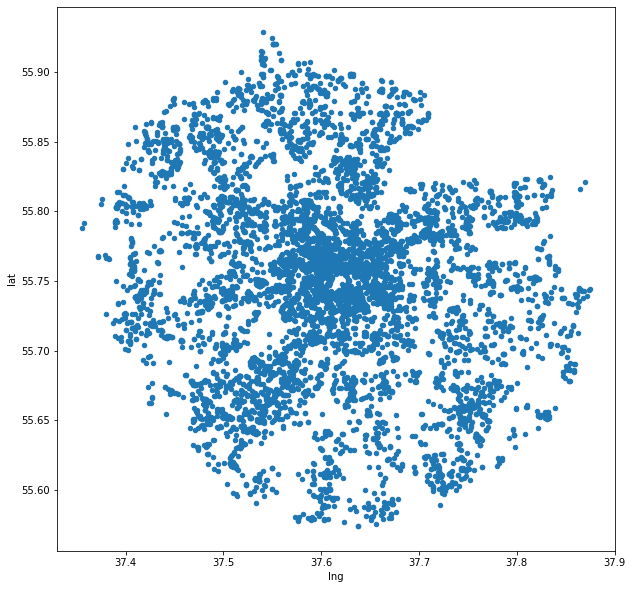

In [15]:
df.plot.scatter(x='lng', y='lat', figsize=(10, 10))
plt.show()

Дубликатов нет.
Пропуски есть, и в некоторых столбцах их очень много, но на данный момент заменить их не получится.
Координаты образуют собой карту Москвы, без аномалий.

Шаг 2.1.Создам столбец street с названиями улиц из столбца с адресом.

In [16]:
def get_street(address):
    address = address.strip().lower()
    address = re.sub(r'\s*,\s*', ',', address)
    address = re.split(',|\.', address)
    return address[1]

In [17]:
df['street'] = df['address'].apply(get_street)

Шаг 2.2. Создам столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [18]:
def is_24_7(time):
    if time != time:
        return np.nan
    elif time == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [19]:
df['is_24_7'] = df['hours'].apply(is_24_7)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,правобережная улица,False


Вывод

Дубликатов нет.
Восстановить пропуски на данный момент нет возможности.
Были добавлены столбцы с названиями улиц и с маркером работы 24/7.

Шаг 3. Анализ данных

Шаг 3.1 Какие категории заведений представлены в данных? Исследую количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построю визуализации.

In [20]:
category = df.groupby('category').agg({'name' : 'count'}).sort_values('name', ascending = False).reset_index()
category

,category,name
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [21]:
fig = px.bar(category,
             x='category',
             y='name',
             text='name',
             labels={'name':'Количество заведений', 'category':'Формат заведения'},
             title='Распределение заведений по категориям')
fig.show()

In [22]:
ax = px.pie(category,
             values = 'name',
             names ='category',
             title='Распределение заведений по категориям')
ax.update_layout(legend_title='Формат заведения')
ax.show()

Вывод

28.3% - кафе
24.3% - ресторан
16.8% - кофейня
7%-9% - бар/паб, пиццерия, быстрое питание
3%-4% - столовая, булочная
Больше всего заведений в категориях кафе, ресторан и кофейня.

Шаг 3.2 Исследую количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построю визуализации. 

In [23]:
seats_analysis = df.groupby('category')['seats'].describe().sort_values('50%', ascending=False).reset_index()
seats_analysis

,category,count,mean,std,min,25%,50%,75%,max
0,ресторан,1268.0,121.869874,123.838539,0.0,48.0,86.0,150.0,1288.0
1,"бар,паб",468.0,124.532051,145.011574,0.0,48.0,82.5,150.0,1288.0
2,кофейня,751.0,111.199734,127.837772,0.0,40.0,80.0,144.0,1288.0
3,столовая,164.0,99.750000,122.951453,0.0,40.0,75.5,117.0,1200.0
4,быстрое питание,349.0,98.891117,106.611739,0.0,28.0,65.0,140.0,1040.0
5,кафе,1217.0,97.365653,117.922464,0.0,35.0,60.0,120.0,1288.0
6,пиццерия,427.0,94.496487,112.282703,0.0,30.0,55.0,120.0,1288.0
7,булочная,148.0,89.385135,97.685844,0.0,25.0,50.0,120.0,625.0


In [24]:
df.loc[df['seats'] == 1288.0, ['name', 'category', 'seats']]

,name,category,seats
6518,delonixcafe,ресторан,1288.0
6524,ян примус,ресторан,1288.0
6574,мюнгер,пиццерия,1288.0
6641,one price coffee,кофейня,1288.0
6658,гудбар,"бар,паб",1288.0
6684,пивной ресторан,"бар,паб",1288.0
6690,японская кухня,ресторан,1288.0
6771,точка,кафе,1288.0
6807,loft-cafe академия,кафе,1288.0
6808,яндекс лавка,ресторан,1288.0


In [25]:
fig = px.box(df.query('seats < 500.0'),
             x="category",
             y="seats",
             points="all",
             color="category",
             labels={'seats':'Количество посадочных мест', 'category':'Формат заведения'}
            )
fig.update_layout(title = 'Количество посадочных мест по категориям',
                  yaxis_range=[0,390])
fig.update_xaxes(categoryorder='array', categoryarray= seats_analysis['category'])

fig.show()

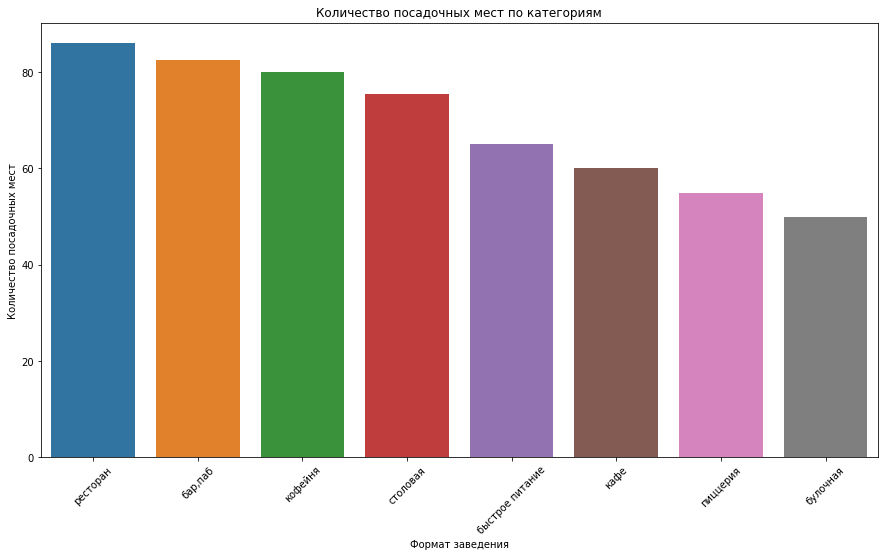

In [26]:
plt.figure(figsize=(15,8))
ax = sns.barplot(x='category', y='50%', data=seats_analysis)
ax.set_xlabel('Формат заведения')
ax.set_ylabel('Количество посадочных мест')
ax.set_title('Количество посадочных мест по категориям')
plt.xticks(rotation=45)
plt.show()

Вывод

В подавляющем большинстве заведений количество посадочных мест не превышает 100.
В ресторанах и барах медианное количество посадочных мест около 80.

Шаг 3.3. Рассмотрю и изобразижу соотношение сетевых и несетевых заведений в датасете. 

In [27]:
fig = px.pie(df.groupby('chain').agg(count = ('chain', 'count')).reset_index(),
             values = 'count',
             names = 'chain',
             title='Соотношение сетевых и несетевых заведений на рынке Москвы'
            )
fig.update_layout(legend_title='Тип заведений')
fig.show()

Вывод

В Москве несетевых заведений больше (61.9%) чем сетевых (38.1%)

Шаг 3.4. Какие категории заведений чаще являются сетевыми? 

In [28]:
chain_merge = category.merge((df
                              .query('chain == "сетевое"')
                              .groupby('category', as_index=False)
                              .agg(count=('name', 'count'))
                             ), on='category')
chain_merge['percent'] = round((chain_merge['count'] / chain_merge['name'])*100, 0).astype('int')
chain_merge.sort_values('percent', ascending=False)

,category,name,count,percent
7,булочная,256,157,61
4,пиццерия,633,330,52
2,кофейня,1413,720,51
5,быстрое питание,603,232,38
1,ресторан,2041,729,36
0,кафе,2377,779,33
6,столовая,315,88,28
3,"бар,паб",765,169,22


In [29]:
fig = px.bar(chain_merge.sort_values('percent', ascending=False),
             x='category',
             y='percent',
             text='percent',
             labels={'percent':'Процент сетевых заведений',
                     'category':'Формат заведения'
                    },
             title='Процент сетевых заведений от общего количества заведений'
            )
fig.update_layout(yaxis = {"categoryorder":"total ascending"})
fig.show()

Вывод

Чаще всего сетевыми заведениями являются:

Булочная
Пиццерия
Кофейня

Шаг 4.5. Сгруппирую данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе.

In [30]:
top_15 = (df
          .query('chain == "сетевое"')
          .groupby('name', as_index=False)
          .agg(count=('chain', 'count'))
          .sort_values('count', ascending=False)
          .head(15)
         )
top_15

,name,count
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [31]:
df_chain_cat = (df[df['name'].isin(top_15['name'])]
                .groupby('category', as_index=False)
                .agg(count=('category', 'count'))
                .sort_values('count', ascending=False)
               )

In [32]:
fig = px.bar(df_chain_cat,
             x='category',
             y='count',
             text='count',
             labels={'count':'Количество заведений', 'category':'Формат заведения'},
             title='Топ 15 заведение Москвы, сгруппированных по их формату'
            )
fig.show()

Вывод

Самая крупная сеть в Москве - "Шоколадница".
В категории "кофейня" самое большое количетсво сетей.

Шаг 4.6. Какие административные районы Москвы присутствуют в датасете? 

In [33]:
administration = df.groupby(['district', 'category'], as_index=False).agg(count = ('name', 'count')).sort_values(['district', 'count'], ascending=False)
administration.head(20)

,district,category,count
67,Южный административный округ,кафе,264
70,Южный административный округ,ресторан,202
68,Южный административный округ,кофейня,131
66,Южный административный округ,быстрое питание,85
69,Южный административный округ,пиццерия,73
64,Южный административный округ,"бар,паб",68
71,Южный административный округ,столовая,44
65,Южный административный округ,булочная,25
59,Юго-Западный административный округ,кафе,238
62,Юго-Западный административный округ,ресторан,168


In [34]:
fig = px.bar(administration,
             x='count',
             y='district',
             color='category',
             orientation='h',
             text='count',
             labels={'count':'Количество заведений', 'category':'Формат заведения', 'district':'Округ Москвы'},
             title='Распределение формата заведений по округам'
            )
fig.update_layout(height=600, yaxis = {"categoryorder":"total ascending"})
fig.show()

Вывод

Самое большое количество заведений в Центральном административном округе, рестораны доминируют.
Самое маленькое количество заведений в Северо-Западном административном округе.

Шаг 4.7. Визуализируйю распределение средних рейтингов по категориям заведений. 

In [35]:
rating_mean_category = (df
                        .groupby(['district', 'category'], as_index=False)
                        .agg(mean_rating = ('rating', 'mean'))
                        .sort_values('mean_rating', ascending=False)
                       )
rating_mean_category

,district,category,mean_rating
40,Центральный административный округ,"бар,паб",4.486264
46,Центральный административный округ,ресторан,4.416119
45,Центральный административный округ,пиццерия,4.411504
8,Западный административный округ,"бар,паб",4.398000
32,Северо-Западный административный округ,"бар,паб",4.391304
...,...,...,...
26,Северо-Восточный административный округ,быстрое питание,4.032927
18,Северный административный округ,быстрое питание,3.975862
10,Западный административный округ,быстрое питание,3.969355
34,Северо-Западный административный округ,быстрое питание,3.950000


In [36]:
fig = px.histogram(rating_mean_category,
                   x='district',
                   y='mean_rating',
                   color = 'category',
                   barmode='group',
                   labels={'district':'Округ Москвы', 'mean_rating':'Средний рейтинг заведения', 'category':'Формат заведения'},
                   title='Распределение средних рейтингов по категориям заведений'
                  )
fig.update_layout(
    yaxis_range=[3.9, 4.5],
    height=500)
fig.show()

Вывод

Самые высокие рейтинги заведений в Центральном административном окргуе. Большинство заведений в ЦАО вероятнее всего сильно выше по уровню сервиса, в сравнении с заведениями в соседних регионах.

Шаг 4.8. Построю фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [37]:
rating_mean_district = df.groupby('district', as_index=False).agg(mean_rating = ('rating', 'mean'))
rating_mean_district

,district,mean_rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [38]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=rating_mean_district,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
).add_to(m)
m

In [39]:
# создаём карту Москвы
j = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(j)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
j

Шаг 4.9.Найду топ-15 улиц по количеству заведений. 

In [40]:
street_count = (df.groupby('street')
                .agg(count=('name', 'count'))
                .sort_values('count', ascending=False)
               )
street_count.head(15)

,count
street,
проспект мира,183
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


In [41]:
street_cat = df[df['street'].isin(street_count.head(15).index.tolist())].groupby(['street', 'category'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)

In [42]:
ax = px.bar(street_cat, 
            x='count', 
            y='street', 
            color='category', 
            orientation='h', 
            text='count', 
            labels={'street':'Название улицы', 'count':'Количество заведений', 'category':'Формат заведения'},   
            title='ТОП-15 улиц с самым большим количеством заведений')
ax.update_layout(height=600, yaxis = {"categoryorder":"total ascending"})
ax.show()

Вывод

Самое большое количество заведений на улице Проспект мира.
Самые популярные категории заведений: кафе и ресторан.

Шаг 4.10. Найду улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [43]:
street_count_solo = (df[df['street'].isin(street_count.query('count == 1').index.tolist())]
                     .groupby('category', as_index=False)
                     .agg(count=('name', 'count'))
                     .sort_values('count', ascending=False))
street_count_solo

,category,count
3,кафе,158
6,ресторан,93
4,кофейня,83
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


In [44]:
fig = px.bar(street_count_solo, 
             x='category', 
             y='count',  
             text='count',
             labels={'count':'Количество улиц', 'category':'Формат заведения', 'category':'Формат заведения'},
             title='Количество улиц с одним заведением')
fig.show()

Вывод
По графику видно:

На не популярных улицах больше всего кафе, далее идут рестораны и кофейни.
Можно предположить что связано это с тем, что такие заведения как столовая, бар, пиццерия и быстрое питание, открывают там где большой поток клиентов. А кафе, ресторан и кофейни, могут открывать в местах где нет конкурентов и без огромной проходимости.

Шаг 4.11. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаю медиану этого столбца для каждого района. Используйю это значение в качестве ценового индикатора района. Построю фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализирую цены в центральном административном округе и других.

In [45]:
bill_median_district = (df
                        .groupby('district', as_index=False)
                        .agg(median_bill = ('middle_avg_bill', 'median'))
                        .sort_values('median_bill', ascending=False)
                       )
bill_median_district

,district,median_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [46]:
moscow_lat, moscow_lng = 55.751244, 37.618423
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=bill_median_district,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана средних чеков по районам'
).add_to(n)
n

Вывод

ожидаемо самый дорогой средний чек в ЦАО и ЗАО (самые дорогие районы Москвы)
самые дешевый средний чек в СВАО и ЮВАО
остальные районы не сильно отличаются друг от друга

Общий вывод
больше всего заведений в категориях кафе, ресторан и кофейня;
в подавляющем большинстве заведений количество посадочных мест не превышает 100;
40% всех заведений являются сетевыми ( у булочных 60% и кофейня, пиццерия 50%);
чаще всего сетевыми заведениями являются: кафе, рестораны и кофейни;
больше всего заведений в ЦАО, так же в нем в отличие от других районов, доминируют рестораны;
самый высокий рейтинг по всем районам у баров, самый низкий рейтинг почти по всем районам у быстрого питания и кафе;
больше всего заведений на пр. Мира, ул. Профсоюзной. пр. Вернадского и Ленинский пр. (обусловлено это тем что эти улицы очень длинные);
на не популярных улицах (1 заведение на всю улицу) чаще всего расположены кафе, рестораны и кофейни;
самый дорогой средний чек в ЦАО и ЗАО (самые дорогие районы Москвы), а самый дешевый средний чек в СВАО и ЮВАО.

Шаг 4. Детализируем исследование: открытие кофейни

Шаг 4.1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [47]:
df_cafe = df.query('category == "кофейня"')
print(f'Всего в Москве {df_cafe["name"].nunique()} кофеен')

Всего в Москве 826 кофеен


In [48]:
district_info_cafe = (df_cafe
                      .groupby('district', as_index=False)
                      .agg(count=('name', 'count'), 
                           cup_avg=('middle_coffee_cup', 'mean'), 
                           mean_rating = ('rating', 'mean'),
                           median_seats = ('seats', 'median')
                          )
                      .sort_values('count', ascending=False))
district_info_cafe

,district,count,cup_avg,mean_rating,median_seats
5,Центральный административный округ,428,187.518519,4.336449,86.0
2,Северный административный округ,193,165.789474,4.291710,66.0
3,Северо-Восточный административный округ,159,165.333333,4.216981,75.0
1,Западный административный округ,150,189.938776,4.195333,96.0
8,Южный административный округ,131,158.488372,4.232824,80.0
0,Восточный административный округ,105,174.023810,4.282857,55.0
7,Юго-Западный административный округ,96,184.176471,4.283333,64.5
6,Юго-Восточный административный округ,89,151.088235,4.225843,50.0
4,Северо-Западный административный округ,62,165.523810,4.325806,87.5


In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423
v = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=district_info_cafe,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Количество кофеен в каждом районе'
).add_to(v)
v

Исключим ЦАО из нашего отображения, так в данном регионе самое большое количество кофеен. Это позволит нам лучше детализировать регионы вокруг ЦАО.

In [50]:
moscow_lat, moscow_lng = 55.751244, 37.618423
v = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=district_info_cafe.tail(-1),
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Количество кофеен в каждом районе без ЦАО'
).add_to(v)
v

In [51]:
cafe = px.bar(district_info_cafe,
              x='district',
              y='count',
              text='count',
              labels={'count':'Количество кофеен', 'district':'Район'},
              title='Количество кофеен по районам')
cafe.show()

In [52]:
moscow_lat, moscow_lng = 55.751244, 37.618423
b = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=district_info_cafe,
    columns=['district', 'cup_avg'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по районам'
).add_to(b)

df_cafe_top3 = df_cafe.query('name != "Шоколадница"').sort_values('middle_coffee_cup', ascending = False).head(3)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(b)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cafe_top3.apply(create_clusters, axis=1)

# выводим карту
b

Точками на хороплете отображены топ-3 кофейни с самой дорогой чашкой капучино в Москве. Две из них ожидаемо находятся в ЦАО.

Шаг 4.2. Определю есть ли круглосуточные кофейни

In [53]:
df_cafe_24_7 = df_cafe.query('is_24_7 == True')

In [54]:
cafe = px.bar((df_cafe_24_7
                      .groupby('district', as_index=False)
                      .agg(count=('name', 'count'))
                      .sort_values('count', ascending=False)),
              x='district',
              y='count',
              text='count',
              labels={'count':'Количество круглосуточных кофеен', 'district':'Район'},
              title = 'Количество круглосуточных кофеен по районам'
             )
cafe.show()

Ожидаемо, в ЦАО круглосуточных кофеен больше всего. В целом, распределение бьется с общим количеством заведений по регионам.

Шаг 4.3. Какие у кофеен рейтинги? Как они распределяются по районам?

In [55]:
moscow_lat, moscow_lng = 55.751244, 37.618423
g = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=district_info_cafe,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Распределение средних рейтингов кофеен по районам',
    ).add_to(g)
g

На хороплете видно, что самый высокий рейтинг в регионах ЦАО, СЗАО.

Шаг 4.4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

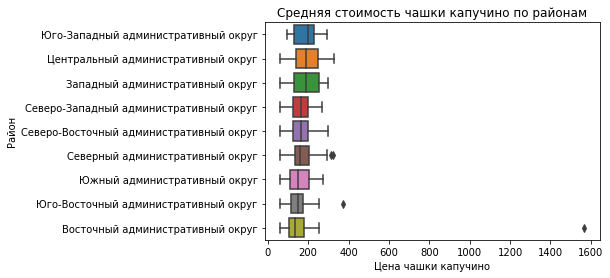

In [56]:
order = df_cafe.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).index
ax = sns.boxplot(data=df_cafe, y='district', x='middle_coffee_cup', order=order)
ax.set_xlabel("Цена чашки капучино")
ax.set_ylabel("Район")
ax.set_title("Средняя стоимость чашки капучино по районам")
plt.show()

Дешевый сегмент кафе находится в регионах: ЮАО, ЮВАО, ВАО.
Средний сегмент кафе находится в регионах: САО, СВАО, СЗАО.
Дорогой сегмент кафе находится в регионах: ЦАО, ЗАО, ЮЗАО.

In [57]:
coffee_house_avg = df_cafe.query('middle_coffee_cup.notnull()')

In [58]:
coffee_house_avg.groupby('district').agg({'middle_coffee_cup': 'describe'})

middle_coffee_cup              \
                                                    count        mean   
district                                                                
Восточный административный округ                     42.0  174.023810   
Западный административный округ                      49.0  189.938776   
Северный административный округ                      76.0  165.789474   
Северо-Восточный административный округ              60.0  165.333333   
Северо-Западный административный округ               21.0  165.523810   
Центральный административный округ                  162.0  187.518519   
Юго-Восточный административный округ                 34.0  151.088235   
Юго-Западный административный округ                  34.0  184.176471   
Южный административный округ                         43.0  158.488372   

                                                                          \
                                                std   min     25%    50%   
district                                                                   
Восточный административный округ         225.384710  60.0  106.25  135.0   
Западный административный округ           74.227243  60.0  130.00  189.0   
Северный административный округ           62.668081  60.0  133.00  159.0   
Северо-Восточный административный округ   63.644049  60.0  123.00  162.5   
Северо-Западный административный округ    60.797713  60.0  124.00  165.0   
Центральный административный округ        67.263201  60.0  139.00  190.0   
Юго-Восточный административный округ      62.421523  60.0  112.50  147.5   
Юго-Западный административный округ       57.536007  95.0  129.00  198.0   
Южный административный округ              66.133117  60.0  107.50  150.0   

                                                         
                                            75%     max  
district                                                 
Восточный административный округ         177.50  1568.0  
Западный административный округ          256.00   300.0  
Северный административный округ          204.25   325.0  
Северо-Восточный административный округ  201.25   297.0  
Северо-Западный административный округ   200.00   270.0  
Центральный административный округ       250.00   328.0  
Юго-Восточный административный округ     173.75   375.0  
Юго-Западный административный округ      229.25   291.0  
Южный административный округ             202.50   275.0

Вывод
ЦАО доминирует по всем фронтам, конкуренция огромная, требования к заведениям очень высокие. Если мы только пробуем открывать кафе, то этот регион не самый предпочтительный для теста.

Одним из перспективных районов для открытия кофейни считаю СЗАО.

Самое низкое количество кофеен в районе, конкуренция будет ниже;
Самые высокие оценки кофеен и в целом по каждому заведению, значит жители более лояльны;
Очень мало, а именно всего две круглосуточные кофейни;
Цена чашки капучино как и везде, около 165 рублей;
Жители уважают кофейни с большим количеством посадочных мест (а в данном районе в среднем 87 мест).

Ссылка на презентацию: https://disk.yandex.ru/d/wSX1IVjyfovKhw